# ECS7020P mini-project submission

The mini-project consists of two components:


1.   **Basic solution** [6 marks]: Using the MLEnd Hums and Whistles dataset, build a machine learning pipeline that takes as an input a Potter or a StarWars audio segment and predicts its song label (either Harry or StarWars).
2.   **Advanced solution** [10 marks]: There are two options. (i) Formulate a machine learning problem that can be attempted using the MLEnd Hums and Whistles dataset and build a solution model. (ii) Create a product that uses the functionality provided by a model trained on the MLEnd Hums and Whistles dataset (e.g. a simple App that predicts the label Harry or StarWars when you hum to it).  

The submission will consist of two Jupyter notebooks, one for the basic solution and another one for advanced solution. Please **name each notebook**:

* ECS7020P_miniproject_basic.ipynb
* ECS7020P_miniproject_advanced.ipynb

then **zipped and submitted toghether**.

Each uploaded notebook should consist of: 

*   **Text cells**, describing concisely each step and results.
*   **Code cells**, implementing each step.
*   **Output cells**, i.e. the output from each code cell.

and **should have the structure** indicated below. Notebooks will not be run, please make sure that the output cells are saved.

How will we evaluate your submission?

*   Conciseness in your writing (10%).
*   Correctness in your methodology (30%).
*   Correctness in your analysis and conclusions (30%).
*   Completeness (10%).
*   Originality (10%).
*   Efforts to try something new (10%).

Suggestion: Why don't you use **GitHub** to manage your project? GitHub can be used as a presentation card that showcases what you have done and gives evidence of your data science skills, knowledge and experience. 

Each notebook should be structured into the following 9 sections:


# 1 Author

**Student Name**:  Aaron Bryden
**Student ID**:  210781805  



# 2 Problem formulation

**Describe the machine learning problem that you want to solve and explain what's interesting about it.**

Using the MLEnd Hums and Whistles dataset to build a machine learning pipeline classifier that takes as an input a range of songs (4) audio segments and predicts its song label. Multi class classification. songs: Panther,Frozen,Potter,Mamma.

This is interesting because we are now differentiating between multiple songs. This could make it difficult to classify as some songs may have similar traits or features. This is a more complex problem than just distinguishing between hums and whistles. Certain songs may be easier to distinguish as hums rather than as a whistle so it could be interesting to see how many of each the sample contains.

Samples belong to two or more classes and we want to learn from already labeled data how to predict the class of unlabeled data (output).

# 3 Machine Learning pipeline

**Describe your ML pipeline. Clearly identify its input and output, any intermediate stages (for instance, transformation -> models), and intermediate data moving from one stage to the next. Note that your pipeline does not need to include all the stages.**

A machine learning pipeline is the raw computer system data we have (in this case the audio files features) which are the input, which goes through many stages in the machine learning workflow and it then produces output data. The output data in this machine learning problem is the 4 classes in to either the Potter, Mamma,Panther,Frozen label (with the probability of the input is a member of that class). 

The intermediate stages to get to the pipeline can be called the workflow. The pipeline (e.g the trained models ready for deployment),goes through lots of different stages. We go through different layers until we produce an output. The best quality metric depends on the problem we are solving and sometimes accuracy isn't the best measure of pipeline performance, such as in cases that occur a cost for missclassifying.

Intermediate stages include the transformation stage, choosing which classifiers to compare, setting hyperparameter values that our learning algorithm will use, before the training of the model as we cannot change its values during training. Next we begin training the models and use k fold cross validation to compare performance between different models and grid search allows us to compare different parameters also. We select the best pipeline performance based on validation accuracy as this is our quality metric. However we need to be cautious the model isn't overfitting with too high a training accuracy will not generalise well at deployment. The best model will predict the output (class labels) with the least error, so will work best at deployment. 

My specific pipeline for this problem was the normalised solution of the ... classifier. This model had the highest validation accuracy of the models at ... and the training accuracy is only slightly higher at ... so this model can be considered to not be overfitting. However this model isn't the greatest classifier as it only gets the right song label correct ... of the time.

# 4 Transformation stage

**Describe any transformations, such as feature extraction. Identify input and output.**

Transformations are data manipulations that change the way that we represent our samples. They can be seen as moving samples from one space to another. In this pipeline was are using dimensionality reduction as after feature selection the destination space is defined by a subset of the original features.

The first step we took was to sample the population dataset. The public folders had over 400 audio files for each song however we used half and also deleted the files not named correctly. We chose to omit these as we believe that we have chosen enough data to create an accurate multi class classifer. With less data we get faster processing time to actually run and create the pipeline and we also take up less computer space. This can lead to a model created faster especially under time constraints, however the trade off is that not using all the data available of the represented population can lead to a less accurate classifier as more data should equal to better predictions in most cases. We may be sacirificng accuracy for more simplicity in creating the model.

Next we carry out the data pre processing. Poor data quality can have an adverse effect on our pipeline. Among the common data quality issues include noise, outliers, missing values, and duplicate data. We attempt to alleviate some of these data quality problems in order to get more accurate predicitons and better models. We may also need to scale our data using normalisation. We can run models with and without this applied to test for accuracy.

Feature selection is a method to reduce the dimensionality of a dataset that assumes that only a subset of the original attributes are relevant. After we have chosen our features, we need a model trained on each subset of features. The most relevant subset has the highest validation accuracy. To select the most relevant features, we need to be able to assign a score to different subsets of features. As we can use our target metric to evaluate how relevant a subset of attributes are, we can use the validation accuracy to score. Feature selection, where the features we chose consisted of tempogram, spectral_centroids, spectral_rolloff,zero cross. These features are all from the librosa website and are proven key features in audo signal classification. We trialled many different feature subsets and we came to the conclusion that these provide the best fit for our current resources.  

We will use the wrapping method as the interaction between features is most likely crucial, we have no choice but to evaluate them together. We do this by first training a model with these different subsets of extracted features, evaluating each resulting model by using validation approaches such as k fold cross validation. Greedy search can be used to reduce the options we have for subsets in large datasets. After feature selection is carried out we can use feature extraction for our final subset of features to be brought forward for the pipeline. As we do not have domain knowledge in this field we done some research in to common features used in audio signals using sites such as Librosa and towardsdatascience. We created subsets of the following features including: tempogram,zero_cross,power, pitch. We also considered spectral centroid and spectral rolloff.

We normalised the data for different ranges between features. After feature selection we are now prepared our data for training.  Another method of feature extraction is Principal component analysis (PCA). This is a method for reducing the number of attributes in the data by projecting the data from its original high-dimensional space into a lower-dimensional space. The new attributes (also known as components) created by PCA have the following properties: they are linear combinations of the original attributes and they capture the maximum amount of variation in the data.PCA removes irrelevant features, improves accuracy and summarises the data using a few well-designed features.

Different transformations and models will give different results in the pipeline.

# 5 Modelling

**Describe the ML models that you will implement.**

We will be using the multi class classification method of supervised learning to predict our song output labels from the audio segment inputs. There are multiple different types of classifiers each with their own advantages. We will be training multiple different ones to see which has the best accuracy at carrying out our task. We

The models we will compare for this machine learning pipeline included Random forest, Naive bayesn and KNN. They all have unique ways of identifying decision boundaries for the problem at hand so it is best to compare classifiers performance on a dataset first especially without domain knowledge. SVM and logistic regression in particular are designed for only binary classification so they should perform best in these tasks. As neither SVM or Logistic regression are possible for this task, we explored other methods and these 3 were the top. 

Random Forest Classifier is more of an accuracy focused algorithm which is in line with our quality metric. Random selection in individual decision trees of RFC can capture more complex feature patterns to provide the best accuracy, so this is a good classifier for our problem. RFC can also tell us how much each feature contributes to class prediction using Feature Importance and tree graphs for better interpretation. Naive bayes is much faster than KNN due to KNN’s real-time execution.Naive bayes and RFC are parametric whereas KNN is non-parametric. Naive Bayes and RFC performs well when we have multiple classes. KNN can perform on any number of classes. The RFC is better for large datasets and more complex data but is at higher risk of overfitting than Bayes which isn't as good for complex data.

# 6 Methodology

**Describe how you will train and validate your models, how model performance is assesssed (i.e. accuracy, confusion amatrix, etc)**

We will explain the following steps in this methodology which lead to the ML pipeline. After data selection, pre processing and feature selection / extraction, we then train our models and classifers on the processed data. Finally we perform k-fold cross validation and select the pipeline with the highest accuracy. We will also be using a confusion matrix to calculate precision and recall but our quality matrix will be the accuracy in this problem.

To allow us to compare and evaluate the performance of the models, we will split our data into training and validation set. It is key to note that the best performing model is the model with the highest validation accuracy, not training accuracy. If a model has high training accuracy and low validation accuracy it is at risk of overfitting as it performs well on the data it has seen before but not the unseen data. This essentially means that the trained model has picked up all the noise from the training dataset and isn't able to generalise. This means with the low validation accuracy that the model will not perform well enough at deployment.

The next stage is to begin training our models. We select the features, classifier and hyperparameter before out model is leafned. Using the input (our pre processed data) our output will be the label of the class the song is placed into. The best model will be the one that correctly predicts the class labels most often. In this case our quality metric is accuracy and the higher the best accuracy should perform best at deployment. This is okay to evaluate our models because we will not incur a cost by estimating incorrectly. 

In this step we select our hyperparameters and GridSearchCV offers a way to choose hyperparameters based on cross-validation. Each possible combination of hyperparameters from each of the lists is evaluated using cross-validation. The best hyperparameter setting is then used to fit a classifier to the training dataset. 

After training our models we evaluate and compare each models validation accuracy as the trained models need to be tested with unseen data to see if it works well in deployment. As this is multi class, our labels will have 4 different values to represent class and the confusion matrix shows how often we correctly predict correctly or not. This may be important in other tasks which have a cost of missclassifying, hwoever this is not the case in this solution so we use the accuracy. Training accuracy can easily lead to an overfitted model and we need to test if our models generalise to the 'population'. It is no good having a good training accuracy and a poor validation accuracy so this is the final step in choosing the best model. Based on validation accuracy we decide which model we are going to take through to deployment before running the final test dataset on our model and then deploying it. 

# 7 Dataset

Describe the dataset that you will use to create your models and validate them. If you need to preprocess it, do it here. Include visualisations too. You can visualise raw data samples or extracted features.

### Describing the dataset

From the public data which was available for the Frozen, Mamma, Panther, Potter songs, we have chosen to use only the folder 1 for our machine learning pipeline. There was also file 2 available for each song, however we chose to omit this as we believe that we have chosen enough data to create an accurate classifer. We also chose to omit the fuiles which were named incorrectly as we have enough correct data to carry out our experiments. Many files were named poorly or contained the wrong song so would make our pipeline worse. We still have 587 files of raw data to create our pipeline and with less data we get faster processing time to train our models, download data and run the pipeline. We also take up less computer space which was starting to become an issue. The sample we have chosen from all available data is thorough and will allow us to carry out the task efficiently. Less data can lead to a model created faster especially under time constraints, however the trade off is that not using all the data available of the represented population can lead to a less accurate classifier as more data to learn from, should equal to better predictions in most cases. We may be sacrificicng accuracy for more simplicity in creating the model.

### Preprocessing 

Poor data quality can have an adverse effect on our pipeline. Among the common data quality issues include noise, outliers, missing values, and duplicate data. We attempt to alleviate some of these data quality problems in order to get more accurate predicitons and better models.

**handling missing values**, **handling noisy data**, **data normalisation**, **aggregation**, **sampling**, **discretisation**

#### Environment set up

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa
import librosa.display
import warnings
warnings.filterwarnings("ignore")

#### Data download

Run the following cell to check that the MLEndHW folder contains the file 'Advanced_Sample':

In [2]:
path = '/Volumes/GoogleDrive/My Drive/Data/MLEndHW'
os.listdir(path)

['sample',
 'MLEndHW_Sample.zip',
 'Advanced_Sample',
 'StarWars_2.zip',
 'Potter_2.zip',
 'Potter_1.zip',
 'StarWars_1.zip',
 '__MACOSX',
 'Basic_Sample.zip',
 'Basic_Sample',
 '.DS_Store']

#### Dataset Sample

In [3]:
# directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndHW/'
# zip_path = '/content/drive/MyDrive/Data/MLEndHW/Advanced_Sample.zip'
# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall(directory_to_extract_to)

In [4]:
sample_path = '/Volumes/GoogleDrive/My Drive/Data/MLEndHW/Advanced_Sample/*.wav'
files = glob.glob(sample_path)

# files.remove( '/Volumes/GoogleDrive/My Drive/Data/MLEndHW/Advanced_Sample/S52_whistle_2_Mamma.wav')

len(files)

587

In [5]:
# path1 = '/Volumes/GoogleDrive/My Drive/Data/MLEndHW/Advanced_Sample/'
# os.listdir(path1)

#### Random Audio Files Inspection

In [6]:
for _ in range(5):
    n = np.random.randint(300)
    display(ipd.Audio(files[n]))

### Dataframe for analysis and cleaning

In [7]:
MLENDHW_table = [] 

for file in files:
    if file == '.DS_Store':
        continue
    file_name = file.split('/')[-1]
    participant_ID = file.split('/')[-1].split('_')[0]
    interpretation_type = file.split('/')[-1].split('_')[1]
    interpretation_number = file.split('/')[-1].split('_')[2]
    song = file.split('/')[-1].split('_')[3].split('.')[0]
    MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

In [8]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 

MLENDHW_df
MLENDHW_df.song.value_counts()

# MLENDHW_df.query('song =="Potter "')


Potter     201
Panther    155
Frozen     154
Mamma       77
Name: song, dtype: int64

In [9]:
MLENDHW_df[(MLENDHW_df.duplicated() == True)]
MLENDHW_df = MLENDHW_df.drop_duplicates()

files.remove( '/Volumes/GoogleDrive/My Drive/Data/MLEndHW/Advanced_Sample/S52_whistle_2_Mamma.wav')

Here we check the data frame of the files for any duplicates, any incorrect file names and any missing values(no audio). This will clean the data up so that we don't get any issues with wrongly labelled file names, which is a common issue when dealing with data because of human error. After identifying all the incorrect files and/or duplicates, we can either edit them in the data frame or we can change the file manually which may be a better solution due to re use of the data sample in the future. We present the final data frame fully pre processed below, ready for the machine learning pipeline.

In [10]:
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
S44_hum_2_Frozen.wav,S44,hum,2,Frozen
S7_hum_4_Frozen.wav,S7,hum,4,Frozen
S52_whistle_2_Frozen.wav,S52,whistle,2,Frozen
S21_hum_2_Frozen.wav,S21,hum,2,Frozen
S58_hum_4_Frozen.wav,S58,hum,4,Frozen
...,...,...,...,...
S110_hum_2_Panther.wav,S110,hum,2,Panther
S110_hum_4_Panther.wav,S110,hum,4,Panther
S111_hum_2_Panther.wav,S111,hum,2,Panther


#### Sampling

We could either choose to go for oversampling or undersampling here as the classes for each song are unequal. Mamma for example has only 77 files compared to Potter with 210 files and we also have a vast amount more of hums than whistles. We have decided to not sample as we already are bordering on a low sample of the population. As the difference isn't too large between songs, we believe this will not effect the accuracy of our pipeline.

### Feature extraction 

#### Feature selection

In [11]:
import sklearn.preprocessing

n=0
fs = None # Sampling frequency. If None, fs would be 22050

In [12]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

x.shape

This audio signal has 693787 samples


(693787,)

#### Zero crossing rate

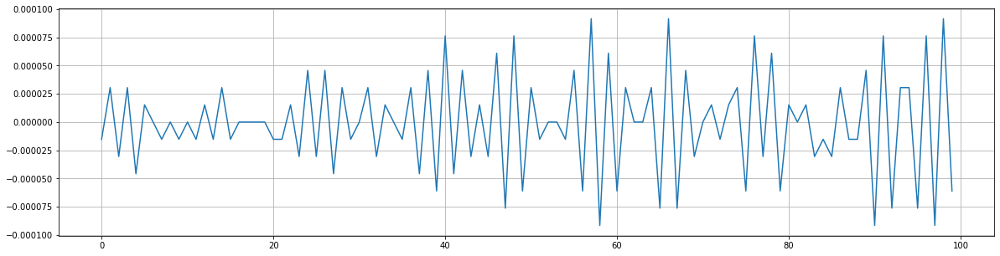

In [13]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(20, 5))
plt.plot(x[n0:n1])
plt.grid()

#### Spectral centroid

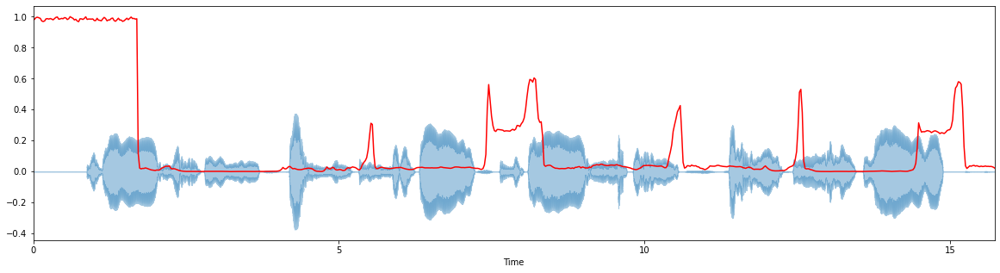

In [14]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=fs)[0]

plt.figure(figsize=(20,5))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

librosa.display.waveplot(x, sr=fs, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

#### Tempogram

In [15]:
hop_length = 512
oenv = librosa.onset.onset_strength(y=x, sr=fs, hop_length=hop_length)
tempogram = np.mean(librosa.feature.tempogram(onset_envelope=oenv, sr=fs,hop_length=hop_length))
        
frames = range(len(oenv))
t = librosa.frames_to_time(frames, sr=fs, hop_length=hop_length)

Text(0.5, 1.0, 'Tempogram: Novelty function')

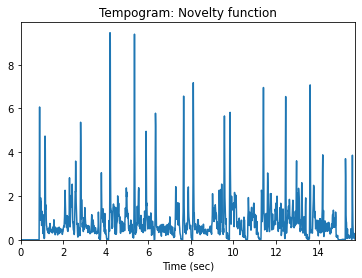

In [16]:
plt.plot(t, oenv)
plt.xlim(0, t.max())
plt.ylim(0)
plt.xlabel('Time (sec)')
plt.title('Tempogram: Novelty function')

#### Pitch

In [17]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

* Audio signals are extremely complex and have too many features for us to use. We use dimensionality reduction and select a few key features which should be able to classify the songs.

In [18]:
import sklearn

def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
    X,y =[],[]
    for file in tqdm(files):
        fileID = file.split('/')[-1]
        file_name = file.split('/')[-1]
        yi = labels_file.loc[fileID]['song']
#         yi = labels_file.loc[fileID]['song']=='Frozen'
#         yi = labels_file.loc[fileID]['song']=='Panther'
        
        fs = None # if None, fs would be 22050
        x, fs = librosa.load(file,sr=fs)
        if scale_audio: x = x/np.max(np.abs(x))
        f0, voiced_flag = getPitch(x,fs,winLen=0.02)
        hop_length = 512
        oenv = librosa.onset.onset_strength(y=x, sr=fs, hop_length=hop_length)
        
#         zero_cross = np.sum(librosa.feature.zero_crossing_rate(x))
#         spectral_centroid = np.mean(librosa.feature.spectral_centroid(x, sr=fs))
        tempogram = np.mean(librosa.feature.tempogram(onset_envelope=oenv, sr=fs,hop_length=hop_length))
        power = np.sum(x**2)/len(x)
        pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
        pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
        voiced_fr = np.mean(voiced_flag)

        xi = [tempogram, power,pitch_mean,pitch_std,voiced_fr]
        X.append(xi)
        y.append(yi)
    
    return np.array(X),np.array(y)


In [19]:
X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 586/586 [31:06<00:00,  3.19s/it]


In [20]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)

The shape of X is (586, 5)
The shape of y is (586,)


# 8 Results

**Carry out your experiments here, explain your results.**

### Modelling

#### Split data into train and validation

In [21]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((410, 5), (176, 5), (410,), (176,))

### Naive bayes

In [22]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

X_train
y_train
X_val
y_val

gnb_A = GaussianNB()
gnb_A.fit(X_train, y_train)

# Here we obtain and print the confusion matrices for the logistic regression classifier trained with data from region A
train_confusion_matrix_naive_A = confusion_matrix(y_true=y_train, y_pred=gnb_A.predict(X_train))
train_confusion_matrix_normalised_naive_A = train_confusion_matrix_naive_A.astype('float') / train_confusion_matrix_naive_A.sum(axis=1)[:, np.newaxis]

val_confusion_matrix_naive_A = confusion_matrix(y_true=y_val, y_pred=gnb_A.predict(X_val))
val_confusion_matrix_normalised_naive_A = val_confusion_matrix_naive_A.astype('float') / val_confusion_matrix_naive_A.sum(axis=1)[:, np.newaxis]

print('Training dataset accuracy: {0}.\n'.format(gnb_A.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.\n'.format(gnb_A.score(X_val,y_val)))

print('Training confusion matrix:\n {}\n'.format(train_confusion_matrix_naive_A))
print('Validation confusion matrix:\n {}\n'.format(val_confusion_matrix_naive_A))

print('Normalised training confusion matrix:\n {}\n'.format(train_confusion_matrix_normalised_naive_A))
print('Normalised validation confusion matrix:\n {}\n'.format(val_confusion_matrix_normalised_naive_A))


Training dataset accuracy: 0.43902439024390244.

Validation dataset accuracy: 0.42613636363636365.

Training confusion matrix:
 [[46 11 11 41]
 [13 20 15  5]
 [15 18 33 41]
 [22 17 21 81]]

Validation confusion matrix:
 [[18  2  3 22]
 [ 6  4  8  5]
 [ 4  6 23 15]
 [17  4  9 30]]

Normalised training confusion matrix:
 [[0.42201835 0.10091743 0.10091743 0.37614679]
 [0.24528302 0.37735849 0.28301887 0.09433962]
 [0.14018692 0.1682243  0.30841121 0.38317757]
 [0.15602837 0.12056738 0.14893617 0.57446809]]

Normalised validation confusion matrix:
 [[0.4        0.04444444 0.06666667 0.48888889]
 [0.26086957 0.17391304 0.34782609 0.2173913 ]
 [0.08333333 0.125      0.47916667 0.3125    ]
 [0.28333333 0.06666667 0.15       0.5       ]]



### Random Forest

In [23]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100, random_state=0)
rfc.fit(X_train, y_train)

print('Training dataset accuracy: {0}.'.format(rfc.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.'.format(rfc.score(X_val,y_val)))

Training dataset accuracy: 1.0.
Validation dataset accuracy: 0.5284090909090909.


* Original model has poor accuracy of 52% so we set some additional hyperparameters with grid search to attempt to find a better combination of parameters. As you can see below, we received the same result of around 52% which is a very bad classifier.

In [24]:
parameters = {'n_estimators': [20, 50, 200, 700], 'max_features': ['auto', 'sqrt', 'log2']}
rfc = RandomForestClassifier(n_estimators=100,random_state=0)
rfc_cv = GridSearchCV(rfc, parameters, cv=5)
rfc_cv.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'.format(rfc_cv.best_estimator_),'\n')
print('Average accuracy across folds of best hyperparameter setting: {0}.'.format(rfc_cv.best_score_),'\n')
print('Training dataset accuracy of best hyperparameter setting: {0}.'.format(rfc_cv.score(X_train, y_train)),'\n')
print('Validation dataset accuracy of best hyperparameter setting: {0}.'.format(rfc_cv.score(X_val, y_val)))

Best hyperparameter setting: RandomForestClassifier(n_estimators=700, random_state=0). 

Average accuracy across folds of best hyperparameter setting: 0.5365853658536586. 

Training dataset accuracy of best hyperparameter setting: 1.0. 

Validation dataset accuracy of best hyperparameter setting: 0.5284090909090909.


Precision for each class: [0.45283019 0.52380952 0.52380952 0.6       ].
Recall for each class: [0.53333333 0.47826087 0.45833333 0.6       ].

Confusion matrix:


,0,1,2,3
0,24,4,8,9
1,8,11,1,3
2,9,5,22,12
3,12,1,11,36


<AxesSubplot:>

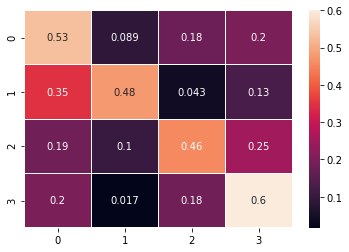

In [25]:
from sklearn.metrics import precision_recall_fscore_support

y_pred1 = rfc_cv.predict(X_val)

precision, recall, _, _ = precision_recall_fscore_support(y_val, y_pred1)
print('Precision for each class: {0}.'.format(precision))
print('Recall for each class: {0}.\n'.format(recall))

df = pd.DataFrame.from_records(confusion_matrix(y_val, y_pred1))
print('Confusion matrix:')
display(df)

import seaborn as sns
# sns.heatmap(df, annot=True, linewidths = 0.01)

cm_normalized = df.astype('float') / df.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, linewidths = 0.01)

#### KNN

In [26]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train,y_train)

print('Training dataset accuracy: {0}.'.format(knn.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.'.format(knn.score(X_val,y_val)))

Training dataset accuracy: 0.6682926829268293.
Validation dataset accuracy: 0.4318181818181818.


In [27]:
parameters = {'n_neighbors': [4, 9, 15, 23, 37]}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, parameters, cv=5)
knn_cv.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'.format(knn_cv.best_estimator_),'\n')
print('Average accuracy across folds of best hyperparameter setting: {0}.'.format(knn_cv.best_score_),'\n')
print('Training dataset accuracy of best hyperparameter setting: {0}.'.format(knn_cv.score(X_train, y_train)),'\n')
print('Validation dataset accuracy of best hyperparameter setting: {0}.'.format(knn_cv.score(X_val, y_val)))

Best hyperparameter setting: KNeighborsClassifier(n_neighbors=15). 

Average accuracy across folds of best hyperparameter setting: 0.5195121951219512. 

Training dataset accuracy of best hyperparameter setting: 0.5878048780487805. 

Validation dataset accuracy of best hyperparameter setting: 0.4943181818181818.


Precision for each class: [0.43902439 0.45454545 0.44736842 0.56      ].
Recall for each class: [0.4        0.43478261 0.35416667 0.7       ].

Confusion matrix:


,0,1,2,3
0,18,4,11,12
1,7,10,1,5
2,9,6,17,16
3,7,2,9,42


<AxesSubplot:>

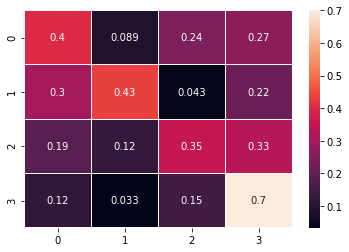

In [28]:
y_pred2 = knn_cv.predict(X_val)

precision, recall, _, _ = precision_recall_fscore_support(y_val, y_pred2)
print('Precision for each class: {0}.'.format(precision))
print('Recall for each class: {0}.\n'.format(recall))

df = pd.DataFrame.from_records(confusion_matrix(y_val, y_pred2))
print('Confusion matrix:')
display(df)

import seaborn as sns
# sns.heatmap(df, annot=True, linewidths = 0.01)

cm_normalized = df.astype('float') / df.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, linewidths = 0.01)

### Normalised solution

In [29]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

### Naive bayes

In [30]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

X_train
y_train
X_val
y_val

gnb_A = GaussianNB()
gnb_A.fit(X_train, y_train)

# Here we obtain and print the confusion matrices for the logistic regression classifier trained with data from region A
train_confusion_matrix_naive_A = confusion_matrix(y_true=y_train, y_pred=gnb_A.predict(X_train))
train_confusion_matrix_normalised_naive_A = train_confusion_matrix_naive_A.astype('float') / train_confusion_matrix_naive_A.sum(axis=1)[:, np.newaxis]

val_confusion_matrix_naive_A = confusion_matrix(y_true=y_val, y_pred=gnb_A.predict(X_val))
val_confusion_matrix_normalised_naive_A = val_confusion_matrix_naive_A.astype('float') / val_confusion_matrix_naive_A.sum(axis=1)[:, np.newaxis]

print('Training dataset accuracy: {0}.\n'.format(gnb_A.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.\n'.format(gnb_A.score(X_val,y_val)))

print('Training confusion matrix:\n {}\n'.format(train_confusion_matrix_naive_A))
print('Validation confusion matrix:\n {}\n'.format(val_confusion_matrix_naive_A))

print('Normalised training confusion matrix:\n {}\n'.format(train_confusion_matrix_normalised_naive_A))
print('Normalised validation confusion matrix:\n {}\n'.format(val_confusion_matrix_normalised_naive_A))


Training dataset accuracy: 0.43902439024390244.

Validation dataset accuracy: 0.42613636363636365.

Training confusion matrix:
 [[46 11 11 41]
 [13 20 15  5]
 [14 18 33 42]
 [22 16 22 81]]

Validation confusion matrix:
 [[18  2  3 22]
 [ 6  4  8  5]
 [ 4  6 23 15]
 [17  4  9 30]]

Normalised training confusion matrix:
 [[0.42201835 0.10091743 0.10091743 0.37614679]
 [0.24528302 0.37735849 0.28301887 0.09433962]
 [0.13084112 0.1682243  0.30841121 0.39252336]
 [0.15602837 0.11347518 0.15602837 0.57446809]]

Normalised validation confusion matrix:
 [[0.4        0.04444444 0.06666667 0.48888889]
 [0.26086957 0.17391304 0.34782609 0.2173913 ]
 [0.08333333 0.125      0.47916667 0.3125    ]
 [0.28333333 0.06666667 0.15       0.5       ]]



### Random Forest

In [31]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100, random_state=0)
rfc.fit(X_train, y_train)

print('Training dataset accuracy: {0}.'.format(rfc.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.'.format(rfc.score(X_val,y_val)))

Training dataset accuracy: 1.0.
Validation dataset accuracy: 0.5284090909090909.


In [32]:
parameters = {'n_estimators': [20, 50, 200, 700], 'max_features': ['auto', 'sqrt', 'log2']}
rfc = RandomForestClassifier(n_estimators=100,random_state=0)
rfc_cv = GridSearchCV(rfc, parameters, cv=5)
rfc_cv.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'.format(rfc_cv.best_estimator_),'\n')
print('Average accuracy across folds of best hyperparameter setting: {0}.'.format(rfc_cv.best_score_),'\n')
print('Training dataset accuracy of best hyperparameter setting: {0}.'.format(rfc_cv.score(X_train, y_train)),'\n')
print('Validation dataset accuracy of best hyperparameter setting: {0}.'.format(rfc_cv.score(X_val, y_val)))

Best hyperparameter setting: RandomForestClassifier(n_estimators=700, random_state=0). 

Average accuracy across folds of best hyperparameter setting: 0.5365853658536586. 

Training dataset accuracy of best hyperparameter setting: 1.0. 

Validation dataset accuracy of best hyperparameter setting: 0.5284090909090909.


Precision for each class: [0.45283019 0.52380952 0.52380952 0.6       ].
Recall for each class: [0.53333333 0.47826087 0.45833333 0.6       ].

Confusion matrix:


,0,1,2,3
0,24,4,8,9
1,8,11,1,3
2,9,5,22,12
3,12,1,11,36


<AxesSubplot:>

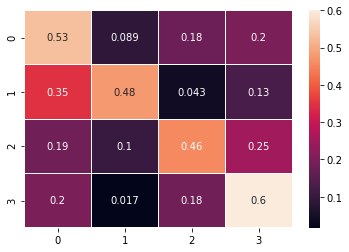

In [33]:
y_pred1 = rfc_cv.predict(X_val)

precision, recall, _, _ = precision_recall_fscore_support(y_val, y_pred1)
print('Precision for each class: {0}.'.format(precision))
print('Recall for each class: {0}.\n'.format(recall))

df = pd.DataFrame.from_records(confusion_matrix(y_val, y_pred1))
print('Confusion matrix:')
display(df)

import seaborn as sns
# sns.heatmap(df, annot=True, linewidths = 0.01)

cm_normalized = df.astype('float') / df.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, linewidths = 0.01)

### KNN

In [34]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train,y_train)

print('Training dataset accuracy: {0}.'.format(knn.score(X_train,y_train)))
print('Validation dataset accuracy: {0}.'.format(knn.score(X_val,y_val)))

Training dataset accuracy: 0.6804878048780488.
Validation dataset accuracy: 0.38636363636363635.


In [35]:
parameters = {'n_neighbors': [4, 9, 15, 23, 37]}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, parameters, cv=5)
knn_cv.fit(X_train, y_train)

print('Best hyperparameter setting: {0}.'.format(knn_cv.best_estimator_),'\n')
print('Average accuracy across folds of best hyperparameter setting: {0}.'.format(knn_cv.best_score_),'\n')
print('Training dataset accuracy of best hyperparameter setting: {0}.'.format(knn_cv.score(X_train, y_train)),'\n')
print('Validation dataset accuracy of best hyperparameter setting: {0}.'.format(knn_cv.score(X_val, y_val)))

Best hyperparameter setting: KNeighborsClassifier(n_neighbors=4). 

Average accuracy across folds of best hyperparameter setting: 0.4390243902439025. 

Training dataset accuracy of best hyperparameter setting: 0.6804878048780488. 

Validation dataset accuracy of best hyperparameter setting: 0.38636363636363635.


Precision for each class: [0.31147541 0.35       0.45098039 0.43181818].
Recall for each class: [0.42222222 0.30434783 0.47916667 0.31666667].

Confusion matrix:


,0,1,2,3
0,19,6,7,13
1,9,7,6,1
2,9,5,23,11
3,24,2,15,19


<AxesSubplot:>

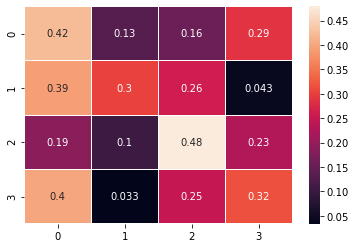

In [37]:
y_pred2 = knn_cv.predict(X_val)

precision, recall, _, _ = precision_recall_fscore_support(y_val, y_pred2)
print('Precision for each class: {0}.'.format(precision))
print('Recall for each class: {0}.\n'.format(recall))

df = pd.DataFrame.from_records(confusion_matrix(y_val, y_pred2))
print('Confusion matrix:')
display(df)

import seaborn as sns
# sns.heatmap(df, annot=True, linewidths = 0.01)

cm_normalized = df.astype('float') / df.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_normalized, annot=True, linewidths = 0.01)

### Explaining results

The results from our experiment are as follows. After evaluating the validation accuracy on our learned models, we select the best ML pipeline for our solution. We evaluated our models by their training accuracy. We compare each models validation accuracy as the trained models need to be tested with unseen data to see if it works well in deployment. Training accuracy can easily lead to an overfitted model and we need to test if our models generalise to the 'population'. It is no good having a good training accuracy and a poor validation accuracy so this is the final step in choosing the best model. 

Other performance measures like specificity, sensitivity, recall are difficult to evaluate for multiclass problems and we are left only with good accuracy as an option. All of our models performed poorly and this could be due to not enough features or data. If this was a binary problem than 50% accuracy would be the worst possible accuracy which we have gotten for our random forest classifier. As this is a multi class problem this is a different case. As accuracy is computed as percent of correctly identified class to all classes, it may be the case that one class is being incorrectly predicted more than the others. Our confusion matrix can help direct us to the issue.

We received poor and low accuracy for all 3 classifiers although we performed a grid search and cross validation. The highest accuracy we achieved for a model was the KNN with best hyperparameter setting: 0.39. All of our models performed poorly in the pipeline so we ran another one where we normalised the data and accuracy was still poor. Although we chose an accuracy of 0.39 for our pipeline and the training accuracy of this model is overfitting in comparison with accuracy at 68%, as this is missclassifying at a rate of under 50% we can flip the labels and achieve an actual accuracy of 62% which makes this the best model of the ones available. This is still poor performance.

Best hyperparameter setting: KNeighborsClassifier(n_neighbors=4), Training accuracy = 0.68, Validation dataset accuracy = 0.39. Although RFC also got similar accuracy but the training dataset largely over fits with an accuracy of 100% Normalisation scales all of the features so they are in similar ranges. (miles and km) for example are in different units. This had no impact on our classifier and in fact some cases such as our KNN classifier become worse. All models performed poorly.

Evaluating model performance with the data used for training is not acceptable because it can easily generate overfitted models and we can fool ourselves. The trained model needs to be tested against unseen data to see how it generalises. We choose the model with the best validation accuracy and we need to be careful not to overfit. if training is higher than validation we are overfitting. 

# 9 Conclusions

**Your conclusions, improvements, etc should go here**

Our ML pipeline could improve in a number of ways. Especially as we got poor performance at deployment, I think the first improvement could be to have more domain knowledge which would allow us to extract the more relevant features.

Next time we can carry out the experiment, random sampling / stratified sampling or oversampling could be used for the imbalanced class issue. This may produce more accurate predictions. We assumed that there was enough data for each class to be either representative of the population or to be enough for decision boundaries to be accurately created.

More features could allow us to have more of the original variation in the data. We only chose 4 features which is of course a small percentage of the sample sizer of features of over 60,000. We may have been better off carrying out PCA which may better represent such a large feature size. PCA summarises the data using a few well-designed features. Removing irrelevant features improves accuracy. The new attributes are defined as operations on the original attributes. This is common when using complex data types such as audio. PCA may have been more applicable to this problem than feature selection. We may have gotten a model which doesn't perform so poorly at deployment.

The model performs poorly at deployment so is not useful. The model also has a slight risk of overfitting as the training accuracy for some of the classifiers is alot higher than the validation accuracy. We got poor performance as our quality metric is accuracy and the highest validation accuracy we got for our pipeline was 50% which is unacceptable for use. 50% is the worst possible classifier so we took the 38% classifier and consider flipping the labels. All models predicts incorrectly too often so is not useful for deployment. As incorrect predictions do not lead to any consequences we did not need to implement a cost function and this also lessens the impact of it not being so accurate. We still calculated the confusion matrix to show that precision, recall were quality metric options which may be of use if we were to expermiment again. These show us how often we predict correctly and how often we don't. The models could either be underfitting or overfitting or there could possibly be outliers we didn't discover in the preprocessing stage. There are a number of factors which could explain the poor models but we have pllenty of ideas in place to improve the experiment.

Another possible improvement could have been to provide the workflow with more data to make our pipeline more robust. We had nearly double the amount of data used still available and this means our pipeline doesnt correctly represent the population of all the data we had available. There may have been more learning based on the rest of the data which could have solved a few issues such as imbalances in classes and also more accurate predictions. We opted for the faster processing speeds and taking up less storage space. There was also lots of incorrectly named files which were removed from the dataset. The trade off is a less robust model and this proved to be an issue in our final pipeline.

In conclusion our model needs significant work and is not fit for deployment. Next time we will work on our domain knowledge and doing more pre processing, transformations to the data (possible PCA), as well as including more data. If time constaints aren't an issue we can get far more accurate models which are fit for deployment.